[Airbnb Dataset Exploration - Group ID:92]

Group Members:
Baturalp Özdamar - 26378
Efe Tıraş - 26798

#Introduction

The project includes a brief inspection of data with graphs in order to create a better understanding of data to the reader. Additionally, with the help of the data we have provided from NYC Open Data, which will be linked below, we will look if there is a correlation between the crime statistics of New York City and the Airbnb data we have. The Airbnb data include columns such as price, neighbourhood, latitude, longitude, number_of_reviews, reviews_per_month. On the other hand, for instance, the NYC data we have found include columns such as the location of the crime (columns named latitude and longitude) which might help us to create a heat map of crime statistics in NYC with the help of folium library in order to compare this heat map to another one which can be created from Airbnb data.

Our first aim is to create graphs from each dataset without combining them in order to create a better understanding of each dataset.


In [1]:
from google.colab import drive
drive.mount("/content/drive", force_remount=True)

path_prefix = "/content/drive/My Drive"

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
import folium.plugins
from folium.plugins import HeatMap
from os.path import join

%matplotlib inline

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


We mounted the libraries which can be helpful in our progress.

In [3]:
df = pd.read_csv(join(path_prefix, "NYPD_crime.csv"))
df.head()

,ARREST_KEY,ARREST_DATE,PD_CD,PD_DESC,KY_CD,OFNS_DESC,LAW_CODE,LAW_CAT_CD,ARREST_BORO,ARREST_PRECINCT,JURISDICTION_CODE,AGE_GROUP,PERP_SEX,PERP_RACE,X_COORD_CD,Y_COORD_CD,Latitude,Longitude
0,206892169,12/31/2019,907.0,"IMPAIRED DRIVING,DRUG",347.0,INTOXICATED & IMPAIRED DRIVING,VTL11920U4,M,M,33,0,25-44,M,WHITE,1000916,245710,40.841085,-73.939769
1,206888084,12/31/2019,739.0,"FRAUD,UNCLASSIFIED-FELONY",112.0,THEFT-FRAUD,PL 1908301,F,Q,101,0,25-44,M,BLACK HISPANIC,1055868,156522,40.596012,-73.742116
2,206890433,12/31/2019,122.0,"HOMICIDE, NEGLIGENT, VEHICLE,",102.0,HOMICIDE-NEGLIGENT-VEHICLE,PL 1251201,F,M,23,0,18-24,M,BLACK,997462,227024,40.789803,-73.952289
3,206890441,12/31/2019,268.0,CRIMINAL MIS 2 & 3,121.0,CRIMINAL MISCHIEF & RELATED OF,PL 1450502,F,S,120,0,18-24,M,BLACK,962822,174282,40.645023,-74.077217
4,206890973,12/31/2019,101.0,ASSAULT 3,344.0,ASSAULT 3 & RELATED OFFENSES,PL 1200001,M,M,25,97,25-44,M,BLACK,1004138,226326,40.787875,-73.928182


In [60]:
data_path = "/content/gdrive/My Drive"
filename = "AB_NYC_2019.csv"
dfA = pd.read_csv(join(path_prefix,filename ), delimiter=",")
dfA.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


We imported the NYPD data and displayed the head of it. The head displays first four items of the data.

# Utilized Datasets

##Displaying Data Types of Every Column

In [5]:
df.dtypes

ARREST_KEY             int64
ARREST_DATE           object
PD_CD                float64
PD_DESC               object
KY_CD                float64
OFNS_DESC             object
LAW_CODE              object
LAW_CAT_CD            object
ARREST_BORO           object
ARREST_PRECINCT        int64
JURISDICTION_CODE      int64
AGE_GROUP             object
PERP_SEX              object
PERP_RACE             object
X_COORD_CD             int64
Y_COORD_CD             int64
Latitude             float64
Longitude            float64
dtype: object

In [0]:
dfA.dtypes

id                                  int64
name                               object
host_id                             int64
host_name                          object
neighbourhood_group                object
neighbourhood                      object
latitude                          float64
longitude                         float64
room_type                          object
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
dtype: object

##Clearing NaN Values

Firstly, we check for the sum of NaN values in each dataset

In [6]:
dfA.isnull().sum()

id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64

In [0]:
df.isnull().sum()

ARREST_KEY              0
ARREST_DATE             0
PD_CD                  41
PD_DESC               159
KY_CD                 159
OFNS_DESC             159
LAW_CODE                0
LAW_CAT_CD           1369
ARREST_BORO             0
ARREST_PRECINCT         0
JURISDICTION_CODE       0
AGE_GROUP               0
PERP_SEX                0
PERP_RACE               0
X_COORD_CD              0
Y_COORD_CD              0
Latitude                0
Longitude               0
dtype: int64

As seen in the code the airbnb data have null values in columns such as name or host_name.

Our crime data also have null values but these null values are in columns that will not be used in our analysis so they do not create any problem.

In [7]:
dfA.fillna({'reviews_per_month':0}, inplace=True)
dfA.fillna({'last_review':0}, inplace=True)
#null values that might be used are replaced with 0

dfA.reviews_per_month.isnull().sum()
dfA.last_review.isnull().sum()

0

## Dropping unnecessary columns

In [9]:
dfA.drop(['id','host_name'], axis=1, inplace=True)
df.drop(['ARREST_KEY','KY_CD'], axis=1, inplace=True)

KeyError: ignored

# Exploring The Data

First we obtain basic data from our datasets

In [10]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
PD_CD,214576.0,4.501211e+02,280.710173,1.000000,175.000000,4.390000e+02,7.290000e+02,9.970000e+02
ARREST_PRECINCT,214617.0,6.242381e+01,35.025560,1.000000,34.000000,6.100000e+01,9.400000e+01,1.230000e+02
JURISDICTION_CODE,214617.0,2.306271e+00,13.561811,0.000000,0.000000,0.000000e+00,0.000000e+00,9.700000e+01
X_COORD_CD,214617.0,1.005367e+06,21353.794323,914103.000000,991221.000000,1.004841e+06,1.017440e+06,1.067302e+06
Y_COORD_CD,214617.0,2.082195e+05,29906.636500,121152.000000,185797.000000,2.068550e+05,2.360710e+05,2.713040e+05
Latitude,214617.0,4.073815e+01,0.082092,40.498957,40.676575,4.073442e+01,4.081461e+01,4.091131e+01
Longitude,214617.0,-7.392377e+01,0.077009,-74.252251,-73.974867,-7.392567e+01,-7.388000e+01,-7.370029e+01


In [0]:
dfA.describe().T

,count,mean,std,min,25%,50%,75%,max
host_id,48895.0,6.762001e+07,7.861097e+07,2438.00000,7.822033e+06,3.079382e+07,1.074344e+08,2.743213e+08
latitude,48895.0,4.072895e+01,5.453008e-02,40.49979,4.069010e+01,4.072307e+01,4.076311e+01,4.091306e+01
longitude,48895.0,-7.395217e+01,4.615674e-02,-74.24442,-7.398307e+01,-7.395568e+01,-7.393627e+01,-7.371299e+01
price,48895.0,1.527207e+02,2.401542e+02,0.00000,6.900000e+01,1.060000e+02,1.750000e+02,1.000000e+04
minimum_nights,48895.0,7.029962e+00,2.051055e+01,1.00000,1.000000e+00,3.000000e+00,5.000000e+00,1.250000e+03
number_of_reviews,48895.0,2.327447e+01,4.455058e+01,0.00000,1.000000e+00,5.000000e+00,2.400000e+01,6.290000e+02
reviews_per_month,48895.0,1.090910e+00,1.597283e+00,0.00000,4.000000e-02,3.700000e-01,1.580000e+00,5.850000e+01
calculated_host_listings_count,48895.0,7.143982e+00,3.295252e+01,1.00000,1.000000e+00,1.000000e+00,2.000000e+00,3.270000e+02
availability_365,48895.0,1.127813e+02,1.316223e+02,0.00000,0.000000e+00,4.500000e+01,2.270000e+02,3.650000e+02


The basic description does not yield many outcomes for the crime data but it shows us the mean of minimum nights or price columns from the Airbnb data.

## Airbnb Data's Price Comparison For Each Neighbourhood

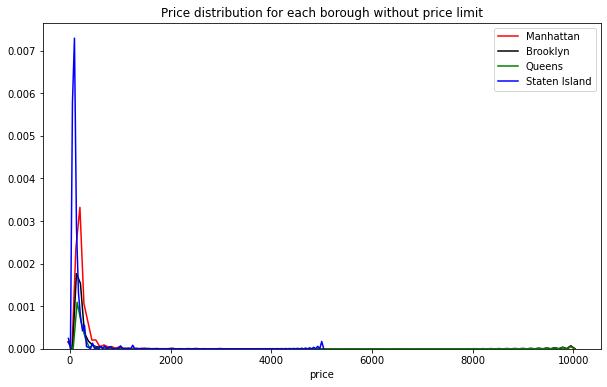

In [11]:
plt.figure(figsize=(10,6))
sns.distplot(dfA[dfA.neighbourhood_group=='Manhattan'].price,color='red',hist=False,label='Manhattan')
sns.distplot(dfA[dfA.neighbourhood_group=='Brooklyn'].price,color='black',hist=False,label='Brooklyn')
sns.distplot(dfA[dfA.neighbourhood_group=='Queens'].price,color='green',hist=False,label='Queens')
sns.distplot(dfA[dfA.neighbourhood_group=='Staten Island'].price,color='blue',hist=False,label='Staten Island')
plt.title('Price distribution for each borough without price limit')
plt.show()

Altough, seeming as a sensible comparison this graph can not clearly show the differences in the price distribution among the boroughs of NYC so in the graph below the same comparison will be made with a limit on the x-axis

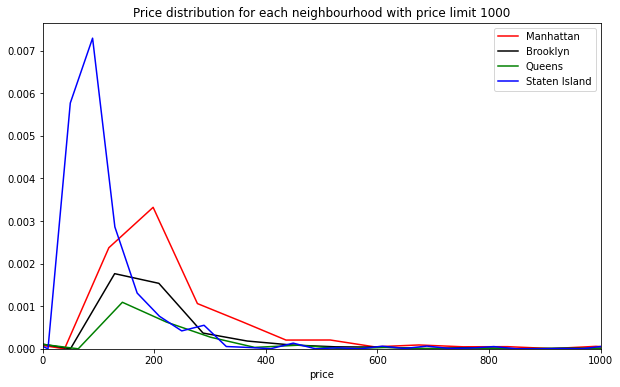

In [0]:
plt.figure(figsize=(10,6))
sns.distplot(dfA[dfA.neighbourhood_group=='Manhattan'].price,color='red',hist=False,label='Manhattan')
sns.distplot(dfA[dfA.neighbourhood_group=='Brooklyn'].price,color='black',hist=False,label='Brooklyn')
sns.distplot(dfA[dfA.neighbourhood_group=='Queens'].price,color='green',hist=False,label='Queens')
sns.distplot(dfA[dfA.neighbourhood_group=='Staten Island'].price,color='blue',hist=False,label='Staten Island')
plt.title('Price distribution for each neighbourhood with price limit 1000')
plt.xlim(0,1000)
plt.show()

Additionally, we can also compare the mean price for each neighbourhood

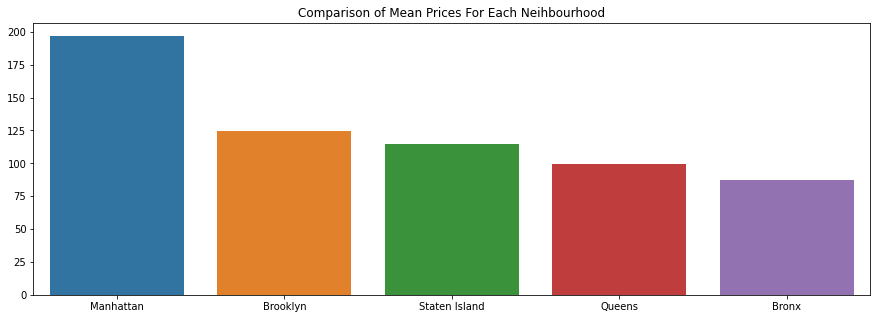

In [0]:
d = dfA.groupby('neighbourhood_group')['price'].mean().sort_values(ascending=False)
fig, ax= plt.subplots(figsize=(15,5))
sns.barplot(d.index.tolist(), d.values, ax=ax)
ax.set_title('Comparison of Mean Prices For Each Neihbourhood')
fig.show()

With the same methodology we can also observe the mean prices for each type of room

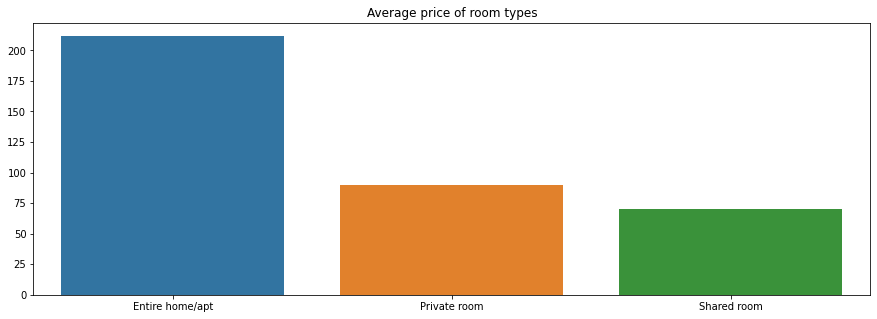

In [0]:
d = dfA.groupby('room_type')['price'].mean().sort_values(ascending=False)
fig, ax= plt.subplots(figsize=(15,5))
sns.barplot(d.index.tolist(), d.values, ax=ax)
ax.set_title('Average price of room types')
fig.show()

## Heat Map For Airbnb And NYC Crime Data

Our aim was to compare the Airbnb hotel locations with the locations where crime has occured. We first tried scatter plots but as both of the datasets contain lots of data we were not able to obtain a good comparison so we moved to creating heat maps.

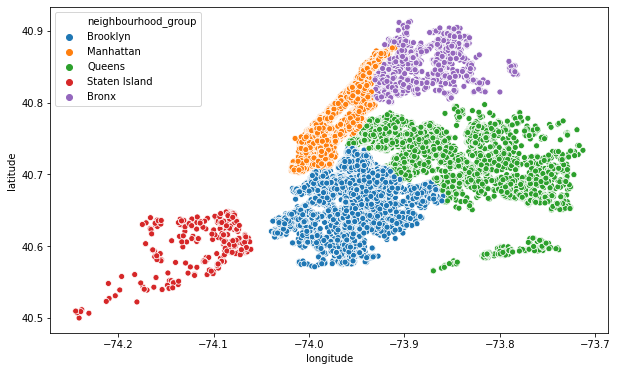

In [0]:
plt.figure(figsize=(10,6))
sns.scatterplot(dfA.longitude,dfA.latitude,hue=dfA.neighbourhood_group)
plt.ioff()

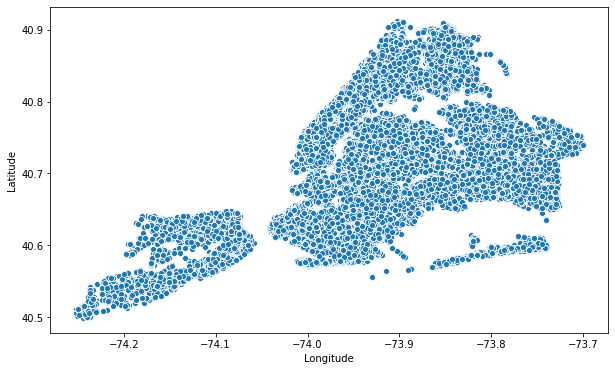

In [0]:
plt.figure(figsize=(10,6))
sns.scatterplot(df.Longitude,df.Latitude)
plt.ioff()
#scatter plot that shows the locations where crime has occured
#unlike tthe graph above this graph is not divided according to neighbourhoods
#because the dataset we are using does have a such column

In [0]:
dfA['latitude'] = dfA['latitude'].astype(float)
dfA['longitude'] = dfA['longitude'].astype(float)
#making sure that all data are type of float
heatmapair = folium.Map(location=[40.7128,-74.0060],zoom_start = 13) 
dfA = dfA.dropna(axis=0, subset=['latitude','longitude'])
heat_data = [[row['latitude'],row['longitude']] for index, row in dfA.iterrows()]
HeatMap(heat_data,radius = 8, gradient={0.2:'blue',0.4:'purple',0.6:'orange',1.0:'red'}).add_to(heatmapair)
heatmapair

This heat map shows the areas in higher density of Airbnb rooms in red whereas areas with less number of Airbnb rooms are shown in blue

In [0]:
df['Latitude'] = df['Latitude'].astype(float)
df['Longitude'] = df['Longitude'].astype(float)
#once again making sure that all data are type of float
heatmapcrime = folium.Map(location=[40.7128,-74.0060],zoom_start = 13) 
df = df.dropna(axis=0, subset=['Latitude','Longitude'])
heat_data = [[row['Latitude'],row['Longitude']] for index, row in df.iterrows()]
HeatMap(heat_data,radius = 8, gradient={0.2:'blue',0.4:'purple',0.6:'orange',1.0:'red'}).add_to(heatmapcrime)
heatmapcrime

This heat map on the other hand shows the density of crime in New York City. Once again denser areas with more crime are shown in red whereas less dense areas are shown in blue

Comparing the two heat maps above it can be seen that some parts of the each map correlate with each other. For instance, areas such as Chinatown, East Broadway and Second Avenue had not only high number of Airbnb rooms but also high number of crime occurences. But on the other hand it can also be seen that this correlation is not consistent and does not hold in many other places so with these graphs and plots in hand it can not be argued that there is a correlation between the locations of the crime occurences and the locations of Airbnb rooms in NYC

# Machine Learning Models

So far we have managed two of our datasets by using features that enable us to clear NaN values or getting rid of columns that we do not need. We have also observed and showed the main features of these datasets while focusing on points such as prices for the Airbnb rooms. 

After the progress report considering the topics covered in class about machine learning we wanted to come up with an algorithm that mighrt be able to predict the price of any Airbnb listing in NYC. But, as this is a very hard algorithm for us to create from scratch we firstly, reviewed many kernels from kaggle and searched for similar machine learning algorithms created by others. 

In [0]:

from sklearn.linear_model    import LinearRegression
from sklearn.ensemble        import RandomForestRegressor
from sklearn.model_selection import cross_val_score, KFold
from sklearn.model_selection import train_test_split
from sklearn.metrics         import mean_squared_error
from sklearn.metrics         import r2_score
import seaborn as sns

Many kernels we have searched for in kaggle included algorithms that predict the price for Airbnb listings. Most of these kernels begin to the process by creating a new dataframe with only columns needed for machine learning and also transform the price column into a log_price column for normalization of the data

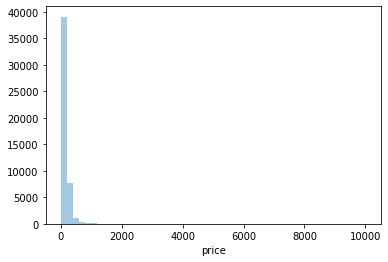

In [43]:
sns.distplot(dfA['price'],kde = False)
plt.show()

# This graph shows that our Airbnb data is skewed to the right so in order to observe the details we will transform
# our price column to a log_price column as stated above. 

Although we have cleared NaN values above the price column of the Airbnb data has 0 values in some rows. These values can create a problem considering that log(0) is not defined so while transforming our prices with log functions a 1 value will be added to the prices. This addition should not create a great difference considering that log(1) = 0.

In [0]:
dfA['log_price'] = np.log(dfA['price']+1)

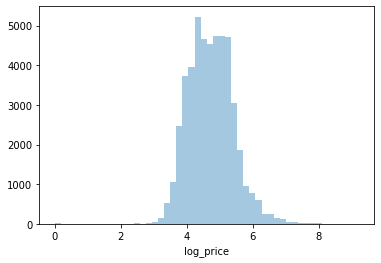

In [20]:
#Replotting the histogram shows that we ended up with a histogram that seems
#more similar to a normal distribution

sns.distplot(dfA['log_price'],kde = False)
plt.show()

In [45]:
#separating labels and predictors
X=dfA.drop('log_price',axis=1)
y=dfA['log_price'].values

#splitting train (75%) and test set (25%)
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=0)
X_train.head()

,name,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
22403,LOCATION! Coffee and Central Park!,17428203,Manhattan,Upper East Side,40.77241,-73.94800,Entire home/apt,124,31,0,0,0.00,2,0
35095,Charming 3bed/2ba Downtown/LES,210170222,Manhattan,Lower East Side,40.71815,-73.98213,Private room,400,3,6,2019-03-31,0.87,1,67
20114,"Quiet, Clean Room in Amazing Location!",2642093,Brooklyn,Greenpoint,40.73124,-73.95527,Private room,75,5,1,2017-10-04,0.05,1,0
13790,JFK 10 & LGA 15 MINUTES AWAY A/C PRIVATE BEDRO...,22959695,Queens,Richmond Hill,40.69317,-73.82527,Private room,50,1,96,2018-11-22,3.77,5,0
12043,Greenwhich Village Luxury Loft,24975940,Manhattan,Greenwich Village,40.73294,-73.99726,Private room,249,4,0,0,0.00,2,0


Now we should also seperate numerical and categorical features of the dataset.

In [46]:
#Selecting numerical dataframe in train set
X_train_num=X_train.select_dtypes(include=np.number)

#Selecting categorical dataframe in train set
X_train_cat=df.select_dtypes(exclude=['number'])

X_train_num.head()

,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
22403,17428203,40.77241,-73.94800,124,31,0,0.00,2,0
35095,210170222,40.71815,-73.98213,400,3,6,0.87,1,67
20114,2642093,40.73124,-73.95527,75,5,1,0.05,1,0
13790,22959695,40.69317,-73.82527,50,1,96,3.77,5,0
12043,24975940,40.73294,-73.99726,249,4,0,0.00,2,0


In this part we seperated the numerical attributes from the categorical attributes and used only the numerical attribtutes. For a more general outcome some of the kernels we have observed also transforms the categorical attributes to numerical attributes and creates a complete linear regression. As this transformation seemed to advanced we skipped such steps.

##Linear Regression

In [28]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

#definiing linear regressor
lin_reg=LinearRegression()

#feeding in X_train and y_train for model fitting
lin_reg.fit(X_train_num,y_train)

#making predictions on train set
lin_predictions = lin_reg.predict(X_train_num)

#getting MSE and RMSE values
lin_mse=mean_squared_error(y_train,lin_predictions)
lin_rmse=np.sqrt(lin_mse)

print("Mean squared error: %.3f" % lin_mse)
print("Root mean squared error: %.3f" % lin_rmse)

# Considering that our mean of log_price was around 5 dollars these errors are not so bad.

Mean squared error: 0.259
Root mean squared error: 0.509


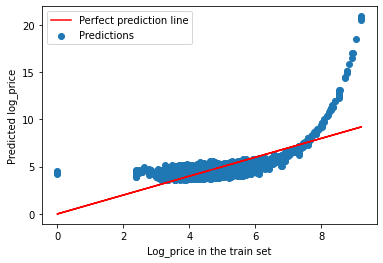

In [29]:
plt.scatter(y_train,lin_predictions, label='Predictions')
plt.plot(y_train,y_train,'r',label='Perfect prediction line')
plt.xlabel("Log_price in the train set")
plt.ylabel("Predicted log_price")
plt.legend()

The graph above shows that in the middle sections our predictions are close to perfectly correct predictions.

##KNN for Price and Neighborhood 

In [66]:


dfA.drop(['name', 'host_id', 'neighbourhood_group', 'neighbourhood', 'room_type', 'last_review'], axis=1, inplace=True)

KeyError: ignored

In [56]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
y = dfA['price']
x = dfA.drop('price', axis = 1)
#splitting the data(80% training, 20% test) with sklearn's train_test_split function
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 0)

#creating a kNN model where K equals to 5
knn = KNeighborsClassifier(5, metric = "euclidean")

#fit the data
knn.fit(x_train, y_train)

#predicting the validation data
y_predict = knn.predict(x_test)

f"{accuracy_score(y_test, y_predict):.2f}"

'0.14'

The above KNN is for the price 

In [57]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler(copy = True, with_mean = True, with_std= True)
scaled_data = scaler.fit_transform(x_train)
scaled_data

array([[ 1.56424473,  0.10997107, -0.14600032, ..., -0.18733088,
         0.62846969, -0.49409009],
       [ 2.60021254,  1.57146021, -0.28585571, ..., -0.15724386,
         1.49316183, -0.90281623],
       [ 0.62994675, -0.87843488,  2.46463374, ..., -0.18733088,
         1.74346745, -0.204857  ],
       ...,
       [ 1.77657684,  0.07877877, -0.23923725, ..., -0.15724386,
        -0.59271834, -0.62436353],
       [-0.8262808 ,  0.80075051, -0.19261878, ..., -0.18733088,
         1.00013561,  0.24217921],
       [-0.23626548, -0.80955188, -0.19261878, ..., -0.18733088,
         1.08357082,  0.65682458]])

In [58]:
accuracy_euclid = []
knn = KNeighborsClassifier(5, metric = "euclidean")

#fit data
knn.fit(scaled_data, y_train)

#predicting the validation data
y_predict = knn.predict(x_test)

#obtaining the accuracy result and then appending it to the list created above
accuracy = accuracy_score(y_test, y_predict)
accuracy_euclid.append(accuracy)

accuracy_euclid

[0.03313222210860006]

In [0]:
#KNN for the neighbourhood_group

from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
y = dfA['neighbourhood_group']
x = dfA.drop('neighbourhood_group', axis = 1)
#splitting the data(80% training, 20% test) with sklearn's train_test_split function
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 0)

#creating a kNN model where K equals to 5
knn = KNeighborsClassifier(5, metric = "euclidean")

#fit the data
knn.fit(x_train, y_train)

#predicting the validation data
y_predict = knn.predict(x_test)

f"{accuracy_score(y_test, y_predict):.2f}"


In [0]:
accuracy_euclid = []
knn = KNeighborsClassifier(5, metric = "euclidean")

#fit data
knn.fit(scaled_data, y_train)

#predicting the validation data
y_predict = knn.predict(x_test)

#obtaining the accuracy result and then appending it to the list created above
accuracy = accuracy_score(y_test, y_predict)
accuracy_euclid.append(accuracy)

accuracy_euclid

##Conclusion

As price is a numeric value it is concluded that it is a better fit to linear regression.

As shown above the knn regression test worked better for neighbourhood_group as it is a categorical attribute hence the accuracy value of the knn for price was higher.

#References
https://www.kaggle.com/spuchalski/predicting-price-of-airbnb-listings-in-nyc

https://www.kaggle.com/jeongmin0812/eda-machine-learning-for-airbnb-price-predictions

https://www.kaggle.com/biphili/hospitality-in-era-of-airbnb

https://www.kaggle.com/alvaroibrain/airbnb-data-analysis

https://www.kaggle.com/dgomonov/
data-exploration-on-nyc-airbnb

https://towardsdatascience.com/predicting-airbnb-prices-with-machine-learning-and-location-data-5c1e033d0a5a

https://nycdatascience.com/blog/student-works/analysis-and-machine-learning-modeling-of-new-york-city-airbnb-data/